In [342]:
import torch
import torchvision
import matplotlib.pyplot as plt
import os    
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True' #without this my kernel keep crashing with plt
import math
from torchvision import transforms 
from torch.utils.data import DataLoader
import torch.nn.functional as F
import numpy as np
from torch import nn

# Diffusion Model using PyTorch


In this notebook, we're gonna build a very simlple diffusion model.

## 1. Data Exploration

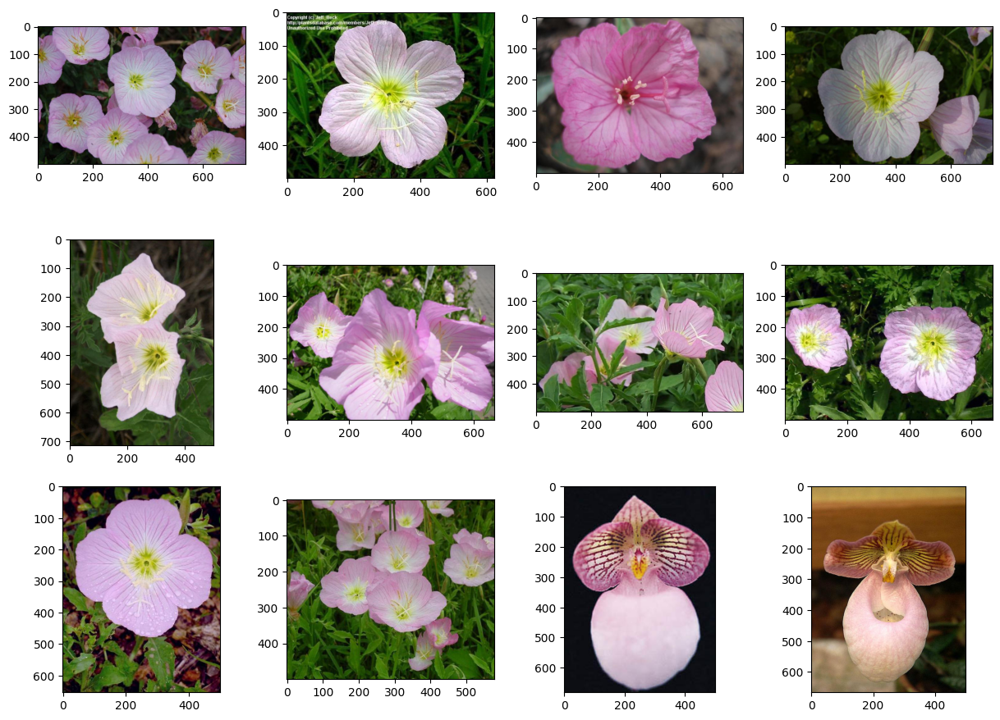

In [343]:
def show_image(dataset, n=12, cols=4):
    """Plots some sample from the dataset"""
    plt.figure(figsize=(15,15))
    for i, img in enumerate(dataset):
        if i == n:
            break
        plt.subplot(int(n/cols)+1, cols, i+1)
        plt.imshow(img[0])
        
data = torchvision.datasets.Flowers102(root=".", download=True)
show_image(data)

# 2. The Diffusion Model

## 2.1 Foward Process

In [440]:
def linear_beta_scheduler(timesteps, start=0.0001, end=0.008):
    return torch.linspace(start, end, timesteps)

def cosine_beta_scheduler(timesteps, start=0.0001, end=0.0025):
    t = torch.linspace(0, math.pi, timesteps)
    cos_values = torch.cos(t)
    betas = start + 0.5 * (end - start) * (1 + cos_values)
    return betas

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, scheduler="linear", device="cpu"):
    """ 
    Takes an image, a timestep and a noise scheduler as input and 
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    '''
    if (t.numpy() == 0).all():
        return x_0, noise
        '''
    
    if(scheduler == "cosine"):
        sqrt_alphas_cumprod_t = get_index_from_list(cosine_sqrt_alphas_cumprod, t, x_0.shape)
        sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
            cosine_sqrt_one_minus_alphas_cumprod, t, x_0.shape
        )
        # mean + variance
        return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
        + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)
    
    elif(scheduler == "linear"):
        sqrt_alphas_cumprod_t = get_index_from_list(linear_sqrt_alphas_cumprod, t, x_0.shape)
        sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
            linear_sqrt_one_minus_alphas_cumprod, t, x_0.shape
        )
        # mean + variance
        return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
        + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)
    
    else:
        print("UNKNOW SCHEDULER ! ONLY 'linear' and 'cosine' are accepted.")
        return noise, noise


#Pre compute betas and alphas
T=300

linear_betas = linear_beta_scheduler(T)
linear_alphas = 1. - linear_betas
linear_alphas_cumprod = torch.cumprod(linear_alphas, axis=0)
linear_sqrt_alphas_cumprod = torch.sqrt(linear_alphas_cumprod)
linear_sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - linear_alphas_cumprod)
linear_sqrt_recip_alphas = torch.sqrt(1.0 / linear_alphas)
linear_alphas_cumprod_prev = F.pad(linear_alphas_cumprod[:-1], (1, 0), value=1.0)
linear_posterior_variance = linear_betas * (1. - linear_alphas_cumprod_prev) / (1. - linear_alphas_cumprod)

cosine_betas = cosine_beta_scheduler(T)
cosine_alphas = 1. - cosine_betas
cosine_alphas_cumprod = torch.cumprod(cosine_alphas, axis=0)
cosine_sqrt_alphas_cumprod = torch.sqrt(cosine_alphas_cumprod)
cosine_sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - cosine_alphas_cumprod)
cosine_sqrt_recip_alphas = torch.sqrt(1.0 / cosine_alphas)
cosine_alphas_cumprod_prev = F.pad(cosine_alphas_cumprod[:-1], (1, 0), value=1.0)
cosine_posterior_variance = cosine_betas * (1. - cosine_alphas_cumprod_prev) / (1. - cosine_alphas_cumprod)


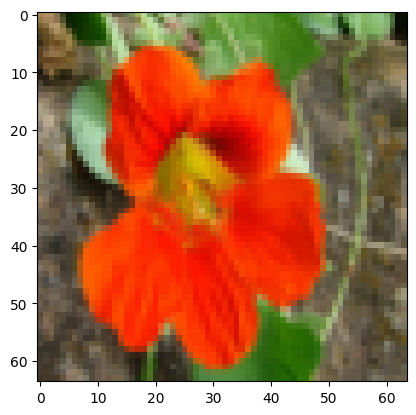

In [538]:
IMG_SIZE = 64
BATCH_SIZE = 128


def transform_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Lambda(lambda t: (t*2)-1)
    ]
    data_transform = transforms.Compose(data_transforms)
    
    train = torchvision.datasets.Flowers102(root=".", download=True, transform=data_transform)
    test = torchvision.datasets.Flowers102(root=".", download=True,transform=data_transform, split='test')
    return torch.utils.data.ConcatDataset([train, test])

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])
    
    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :] 
    plt.imshow(reverse_transforms(image))
    
data = transform_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

image = next(iter(dataloader))[0]
show_tensor_image(image)

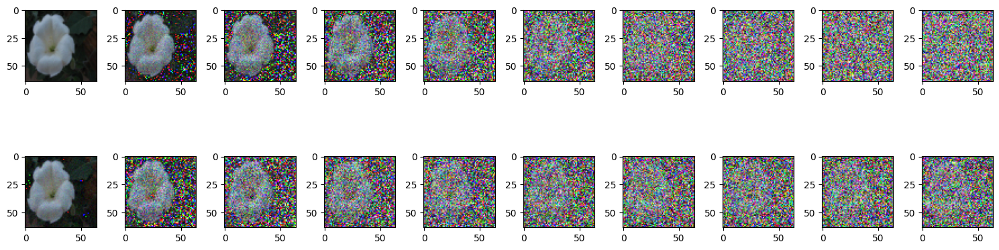

In [443]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,5))
num_images = 10
stepsize = int(T/num_images)


for sch in ["linear", "cosine"]:
    for idx in range(0, T, stepsize):
            t = torch.Tensor([idx]).type(torch.int64)
            if sch == "linear":
                plt.subplot(2, num_images, int(idx/stepsize) + 1)
            else:
                plt.subplot(2, num_images, int(idx / stepsize) + num_images + 1)
            img, noise = forward_diffusion_sample(image, t, scheduler=sch)
            show_tensor_image(img)
            
plt.tight_layout()



## 2.2 Backward process (Neural Network)

In [444]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch) #the time emb need to be the same size than the current number of channels
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)

In [445]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

In [446]:
class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3 
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        
        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])
        
        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)           
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor

## 2.3 Loss 

In [447]:
def get_loss(model, x_0, t, scheduler):
    x_noisy, noise = forward_diffusion_sample(x_0, t, scheduler=scheduler, device=device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

## 2.4 Sampling

In [485]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(linear_betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        linear_sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(linear_sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(linear_posterior_variance, t, x.shape)
    
    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()            

## 2.4 Training

Epoch 0 | step 000 Loss: 0.17162233591079712 


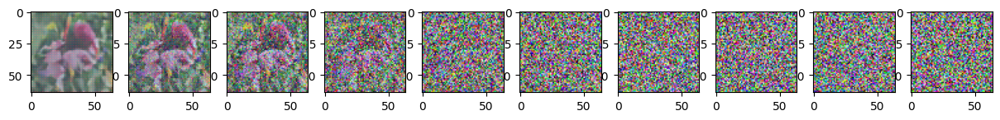

Epoch 5 | step 000 Loss: 0.16507384181022644 


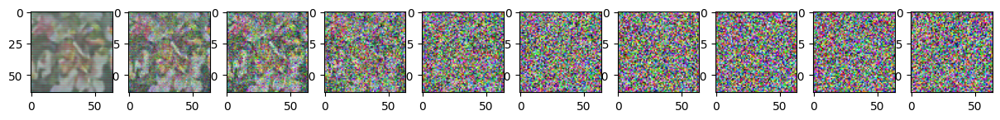

Epoch 10 | step 000 Loss: 0.15135882794857025 


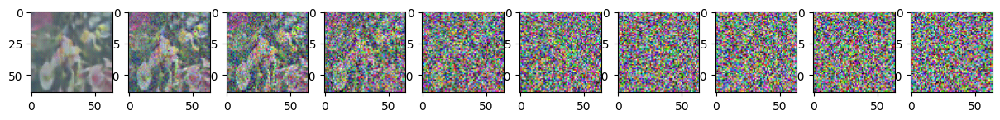

Epoch 15 | step 000 Loss: 0.17892830073833466 


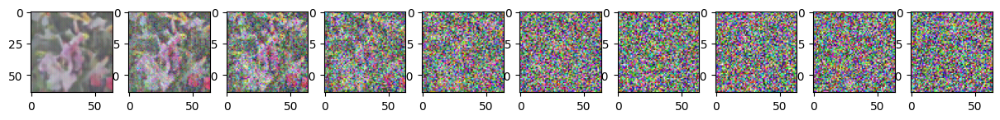

Epoch 20 | step 000 Loss: 0.16336017847061157 


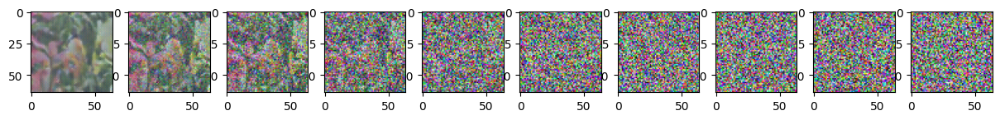

Epoch 25 | step 000 Loss: 0.1602913737297058 


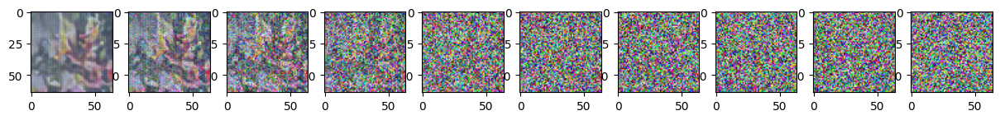

Epoch 30 | step 000 Loss: 0.1584133803844452 


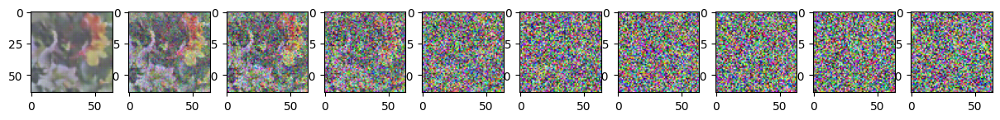

Epoch 35 | step 000 Loss: 0.15855205059051514 


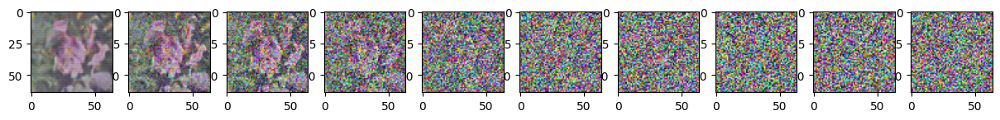

Epoch 40 | step 000 Loss: 0.15918007493019104 


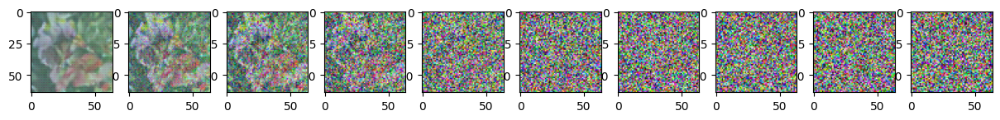

Epoch 45 | step 000 Loss: 0.15820816159248352 


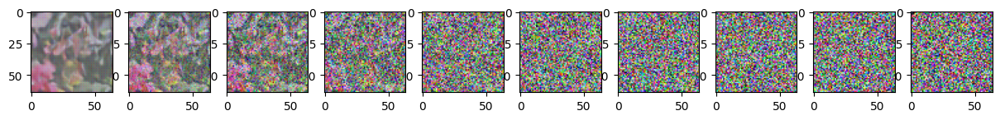

Epoch 50 | step 000 Loss: 0.1518973857164383 


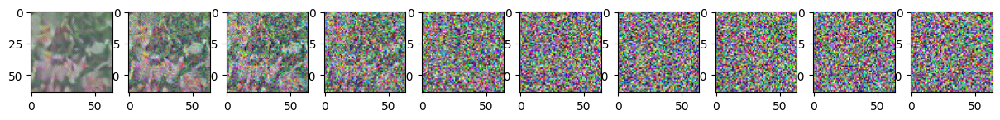

Epoch 55 | step 000 Loss: 0.17057912051677704 


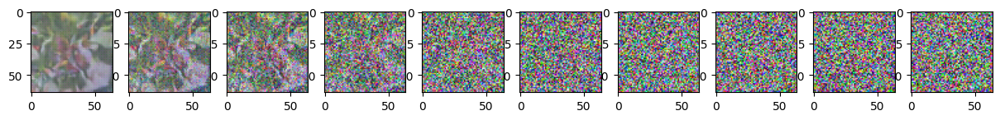

Epoch 60 | step 000 Loss: 0.16649514436721802 


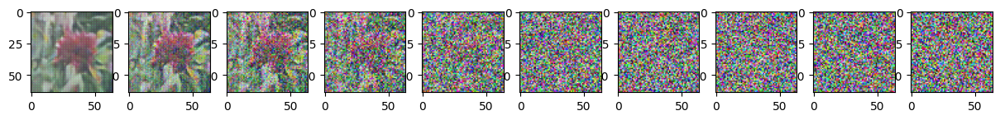

Epoch 65 | step 000 Loss: 0.16668188571929932 


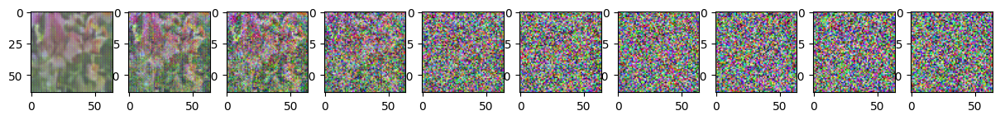

Epoch 70 | step 000 Loss: 0.1637004315853119 


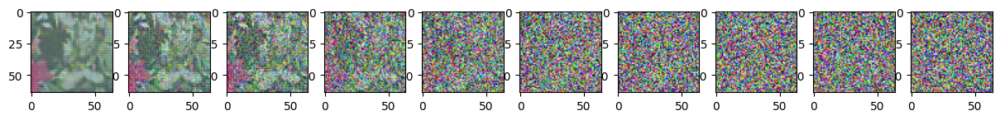

Epoch 75 | step 000 Loss: 0.14683941006660461 


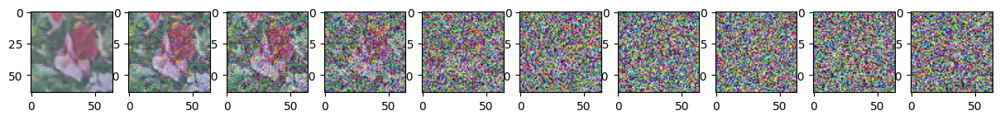

Epoch 80 | step 000 Loss: 0.16511736810207367 


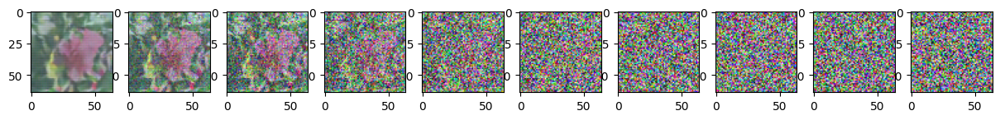

Epoch 85 | step 000 Loss: 0.1624150425195694 


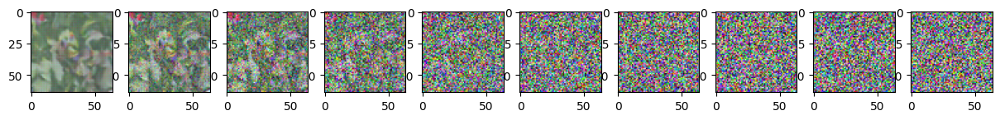

Epoch 90 | step 000 Loss: 0.1676771491765976 


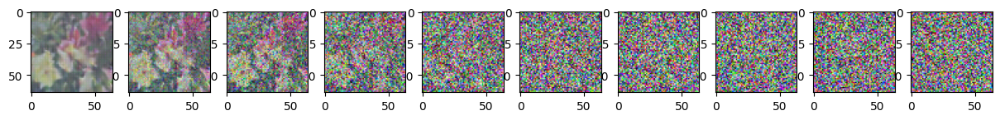

Epoch 95 | step 000 Loss: 0.16465702652931213 


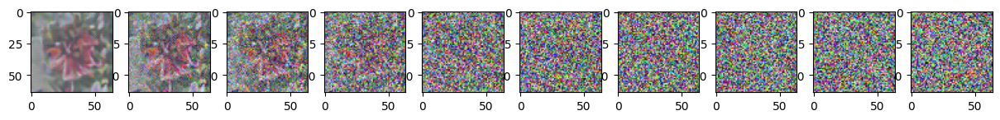

Wall time: 1h 21min 33s


In [486]:
%%time
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
noise_scheduler = "linear" 
epochs = 100 

for epoch in range(epochs):
    
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch[0], t, noise_scheduler)
      loss.backward()
      optimizer.step()

      if epoch % 5 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()

In [522]:
def save_model(model):
    torch.save(model.state_dict(), "./model.pth")

In [523]:
def load_model(model):
    model.load_state_dict(torch.load("./model.pth"))

# 3. Results

## 3.1 Visual Results

In [512]:
@torch.no_grad()
def generate_image(noise):
    """
    Generate one image from random noise using the trained Unet
    """
    image = noise
    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        image = sample_timestep(image, t)
        if i == 0:
            return image
        

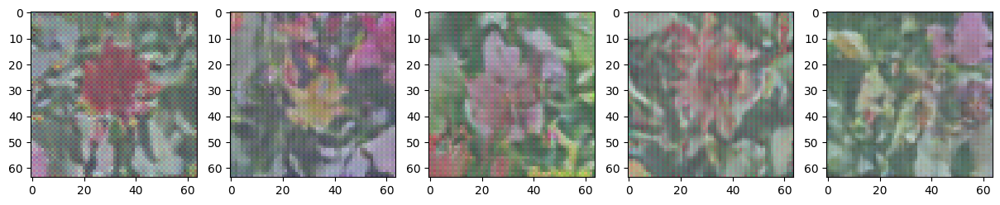

In [513]:
n = 5
plt.figure(figsize=(15,15))
plt.axis('off')
for i in range(0,n):
    noise = torch.randn((1, 3, IMG_SIZE, IMG_SIZE), device=device)
    image = generate_image(noise)
    plt.subplot(1, n, i+1)
    show_tensor_image(image.detach().cpu())
plt.show()    

## 3.2 FID calculation

The implementation of the FID comes from https://github.com/mseitzer/pytorch-fid

In [517]:
class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=[DEFAULT_BLOCK_INDEX],
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False):
        
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()

        
        inception = torchvision.models.inception_v3(weights=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp
    
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
inception = InceptionV3([block_idx])
inception = inception.cuda()

In [518]:
def calculate_activation_statistics(images,model,batch_size=128, dims=2048,
                    cuda=False):
    model.eval()
    act=np.empty((len(images), dims))
    
    if cuda:
        batch=images.cuda()
    else:
        batch=images
    pred = model(batch)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
    if pred.size(2) != 1 or pred.size(3) != 1:
        pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

    act= pred.cpu().data.numpy().reshape(pred.size(0), -1)
    
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma

In [520]:
def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)

In [521]:
def calculate_fretchet(images_real,images_fake,model):
     mu_1,std_1=calculate_activation_statistics(images_real,model,cuda=True)
     mu_2,std_2=calculate_activation_statistics(images_fake,model,cuda=True)
    
     """get fretched distance"""
     fid_value = calculate_frechet_distance(mu_1, std_1, mu_2, std_2)
     return fid_value

In [532]:
noise = torch.randn((1, 3, IMG_SIZE, IMG_SIZE), device=device)
image_gen = generate_image(noise)[0,:,:,:]
print(image_gen.shape)
image_real = next(iter(dataloader))[0][0,:,:,:]
print(image_real.shape)

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
